In [1]:
using SiriusTrack
using Plots

In [2]:
m = SiriusTrack.Models.StorageRing.create_accelerator();

In [3]:
m.cavity_state = 1
m.radiation_state = 1
m

------------------ Accelerator -----------------
	Energy:            3.000e+00  [GeV] 
	Cavity State:      on
	Radiation State:   on
	Vchamber State:    off
	Harmonic Number:   864
	Length:            518.38990  [m]
	Velocity:          299792453.65101194  [m/s]
	Beta Factor:       0.99999999 
	Gamma Factor:      5870.85355072 
	Brho:              5870.85355072 
	Lattice Version:            SI_V25_04_v1.18.0_julia
------------------------------------------------


In [4]:
orb, _ = SiriusTrack.Orbit.find_orbit6(m)
orb[1]


Running find_orbit6

474889.93311215995
fixed dl = -1.1368683772161603e-13, guess = [0.0
 0.0
 0.0
 0.0
 0.0
 -0.01518014951205453]



[4.173940008302119e-8
 -8.463388982202189e-10
 0.0
 0.0
 -1.2532444438469469e-8
 -0.015174766702001087]


In [5]:
@time begin
    pin = SiriusTrack.PosModule.pos(-1.0105258289742652e-8, -4.8333568171487715e-9, 0.0, 0.0, -6.347603944580525e-5, -0.015179112977402966)
    #pin = orb[1]}
    pf, st, ln = SiriusTrack.Tracking.ring_pass(m, pin, 100_000, turn_by_turn=true)
end
pf;

738.108645 seconds (10.18 G allocations: 223.999 GiB, 2.21% gc time)


In [9]:
dl = [i[6] for i in pf]
fdl = sum(dl)/length(dl) 

de = [i[5] for i in pf]
fde = sum(de)/length(de)

x = [i[1] for i in pf]
fx = sum(x)/length(x) 

y = [i[3] for i in pf]
fy = sum(y)/length(y)

px = [i[2] for i in pf]
fpx = sum(px)/length(px) 

py = [i[4] for i in pf]
fpy = sum(py)/length(py)


0.0

In [10]:
fx, fpx, fy, fpy, fde, fdl

(-1.0124529079179449e-8, -4.833267011137105e-9, 0.0, 0.0, -6.347531128073143e-5, -0.01517917380550263)

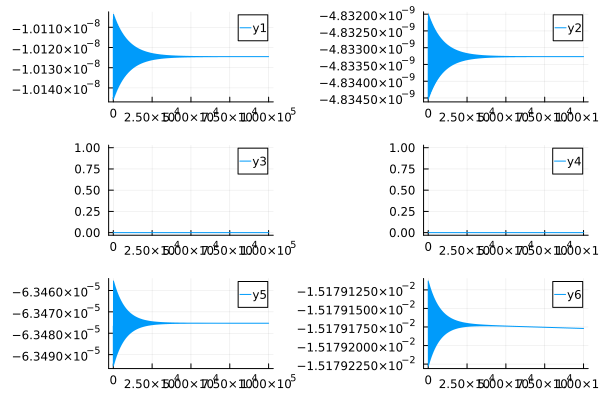

In [11]:
plot()
plot(layout=(3,2))
plot!(x, subplot=1)
plot!(px, subplot=2)
plot!(y, subplot=3)
plot!(py, subplot=4)
plot!(de, subplot=5)
plot!(dl, subplot=6)